In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Task 1: Discriminative Models - CNNs vs. ViT Inductive Biases

### Data Preprocessing for ResNet 50 vs. ViT-S/16
##### We will be working on the STL-10 dataset to test our hypotheses

In [1]:
import torch
import torch.nn as nn
import torchvision
from torchvision import datasets
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision.models import resnet50, ResNet50_Weights, vit_b_16, ViT_B_16_Weights
# from transformers import ViTForImageClassification, ViTImageProcessor, ViTFeatureExtractor
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageFilter, ImageDraw
import random

device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
# ---------------Base Transforms---------------

base_train_transforms = transforms.Compose([
    transforms.Resize(256),               # upscale from 96×96 → ~256
    transforms.RandomResizedCrop(224),    # random crop to 224×224
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])

base_test_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])

# ---------Base Dataset and DataLoader---------

base_trainset = datasets.STL10(root="./STL10_Variants", split="train", download=True, transform=base_train_transforms)
base_testset = datasets.STL10(root="./STL10_Variants", split="test", download=True, transform=base_test_transforms)
visual_base_testset = datasets.STL10(root='./STL10_Variants', split='test', download=True)

base_trainloader = DataLoader(base_trainset, batch_size=64, shuffle=True, num_workers=2)
base_testloader = DataLoader(base_testset, batch_size=64, shuffle=False, num_workers=2)

100%|██████████| 2.64G/2.64G [02:30<00:00, 17.6MB/s] 


In [2]:
STL10_labels = ['airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck']

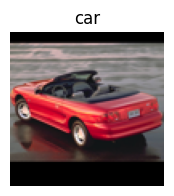

In [3]:
# Sanity visualization of an image sample from test set

STL10_labels = ['airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck']
base_image, base_label = visual_base_testset[555]

plt.figure(figsize=(2, 2))
plt.imshow(base_image)
plt.title(STL10_labels[base_label])
plt.axis('off')
plt.show()

In [4]:
#-------------Creating Semantic Biases Datasets-----------

grayscale_transforms = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.Grayscale(num_output_channels=3),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

gray_testset = datasets.STL10(root="./STL10_Variants", split="test", download=False, transform=grayscale_transforms)
gray_testloader = DataLoader(gray_testset, batch_size=64, shuffle=False, num_workers=2)


#--------------Creating Locality Biases-----------------

translation_transforms = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.RandomAffine(degrees=0, translate=(0.5, 0.5)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

translated_testset = datasets.STL10(root="./STL10_Variants", split="test", download=False, transform=translation_transforms)
translated_testloader = DataLoader(translated_testset, batch_size=64, shuffle=False, num_workers=2)

In [19]:
## PA0 Patch Masking implementation

# def random_mask(pixel_values: torch.Tensor, mask_ratio: float = 0.5):
#     """
#     Your existing function - apply patch masking to a batch
#     Args:
#         pixel_values: Input tensor of shape (batch_size, 3, H, W)
#         mask_ratio: Fraction of patches to mask (0.0 to 1.0)
#     """
#     masked_values = pixel_values.clone()
#     batch_size = pixel_values.shape[0]
    
#     # Get image height and width
#     img_size = pixel_values.shape[-1]
#     patch_size = 16
#     grid_size = img_size // patch_size
#     total_num_patches = grid_size ** 2
#     num_masked = int(total_num_patches * mask_ratio)
    
#     # Apply masking to each image in the batch
#     for i in range(batch_size):
#         # Random permutation for this specific image
#         patch_permutation = torch.randperm(total_num_patches)
#         patches_idx = patch_permutation[:num_masked]
        
#         # Translate between flat patch index and 2D grid position
#         for idx in patches_idx:
#             patch_row = idx // grid_size
#             patch_col = idx % grid_size
#             tensor_row = patch_row * patch_size
#             tensor_col = patch_col * patch_size
#             row_end = tensor_row + patch_size
#             col_end = tensor_col + patch_size
            
#             masked_values[i, :, tensor_row:row_end, tensor_col:col_end] = 0
    
#     return masked_values

# def evaluate_with_masking(model, dataloader, device, mask_ratio=0.5):
#     """Evaluate model with patch masking applied"""
#     model.eval()
#     correct = 0
#     total = 0
    
#     with torch.no_grad():
#         for images, labels in dataloader:
#             images, labels = images.to(device), labels.to(device)
            
#             # Apply patch masking to the batch
#             masked_images = random_mask(images, mask_ratio)
            
#             outputs = model(masked_images)
#             _, predicted = torch.max(outputs.data, 1)
#             total += labels.size(0)
#             correct += (predicted == labels).sum().item()
    
#     accuracy = 100 * correct / total
#     return accuracy

In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [4]:
# Define models
def create_resnet50(num_classes=10):
    """Create and configure ResNet-50 model"""
    model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
    
    # Modify the final layer for STL10 (10 classes)
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, num_classes)
    
    return model

def create_vit_s16(num_classes=10):
    """Create and configure ViT-S/16 model"""
    model = vit_b_16(weights=ViT_B_16_Weights.IMAGENET1K_V1)

    # Modify the final layer for STL10 (10 classes)
    num_ftrs = model.heads.head.in_features
    # model.fc = nn.Linear(num_ftrs, num_classes)
    model.heads.head = nn.Linear(num_ftrs, num_classes)
    
    return model


In [6]:
# Initialize models
resnet_model = create_resnet50().to(device)
vit_model = create_vit_s16().to(device)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 231MB/s]
Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth
100%|██████████| 330M/330M [00:01<00:00, 218MB/s] 


In [7]:
# Freeze Backbone Network (ResNet)
for param in resnet_model.parameters():
    param.requires_grad = False
#  Unfreeze Task Head
for param in resnet_model.fc.parameters():
    param.requires_grad = True

# Freeze Backbone Network (ViT)
for param in vit_model.parameters():
        param.requires_grad = False
#  Unfreeze Task Head
for param in vit_model.heads.head.parameters():
    param.requires_grad = True

## Train and Test Loops

In [17]:
def train_model(model, train_loader, model_name, num_epochs=20, lr=0.001):
    """Simple training loop"""
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()
    
    train_losses, train_accs = [], []
    
    for epoch in range(num_epochs):
        # Training
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        for inputs, labels in tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}'):
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
        
        train_loss = running_loss / len(train_loader)
        train_acc = 100. * correct / total
        train_losses.append(train_loss)
        train_accs.append(train_acc)
        
        print(f'Epoch {epoch+1}: Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%')
        
        # Early stopping if we reach good accuracy
        if train_acc >= 90.0:
            print(f"Reached target accuracy of {train_acc:.2f}% at epoch {epoch+1}")
            break
    
    return train_losses, train_accs

# Simple test function
def test_model(model, test_loader):
    """Test model on test set"""
    criterion = nn.CrossEntropyLoss()
    
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for inputs, labels in tqdm(test_loader):
            inputs, labels = inputs.to(device), labels.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
    
    test_loss = running_loss / len(test_loader)
    test_acc = 100. * correct / total
    
    return test_loss, test_acc

# Plot training curves
def plot_curves(train_losses, train_accs, model_name):
    """Plot training curves"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    # Loss curve
    ax1.plot(train_losses, label='Train Loss')
    ax1.set_title(f'{model_name} - Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    
    # Accuracy curve
    ax2.plot(train_accs, label='Train Accuracy')
    ax2.set_title(f'{model_name} - Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy (%)')
    
    plt.tight_layout()
    plt.show()


In [9]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

# Train ResNet-50
print("Training ResNet-50...")
resnet_train_loss, resnet_train_acc = train_model(
    resnet_model, base_trainloader, "resnet50"
)

# Train ViT
print("\nTraining ViT-B/16...")
vit_train_loss, vit_train_acc = train_model(
    vit_model, base_trainloader, "vit_b16"
)

Training ResNet-50...


Epoch 1/20: 100%|██████████| 79/79 [00:11<00:00,  6.89it/s]


Epoch 1: Train Loss: 1.2642, Train Acc: 69.76%


Epoch 2/20: 100%|██████████| 79/79 [00:10<00:00,  7.41it/s]


Epoch 2: Train Loss: 0.6768, Train Acc: 82.50%


Epoch 3/20: 100%|██████████| 79/79 [00:10<00:00,  7.43it/s]


Epoch 3: Train Loss: 0.5591, Train Acc: 84.10%


Epoch 4/20: 100%|██████████| 79/79 [00:10<00:00,  7.48it/s]


Epoch 4: Train Loss: 0.5216, Train Acc: 83.90%


Epoch 5/20: 100%|██████████| 79/79 [00:10<00:00,  7.44it/s]


Epoch 5: Train Loss: 0.4825, Train Acc: 84.72%


Epoch 6/20: 100%|██████████| 79/79 [00:10<00:00,  7.51it/s]


Epoch 6: Train Loss: 0.4555, Train Acc: 85.46%


Epoch 7/20: 100%|██████████| 79/79 [00:10<00:00,  7.51it/s]


Epoch 7: Train Loss: 0.4400, Train Acc: 85.80%


Epoch 8/20: 100%|██████████| 79/79 [00:10<00:00,  7.48it/s]


Epoch 8: Train Loss: 0.4288, Train Acc: 86.38%


Epoch 9/20: 100%|██████████| 79/79 [00:10<00:00,  7.58it/s]


Epoch 9: Train Loss: 0.4233, Train Acc: 86.20%


Epoch 10/20: 100%|██████████| 79/79 [00:10<00:00,  7.50it/s]


Epoch 10: Train Loss: 0.3912, Train Acc: 86.88%


Epoch 11/20: 100%|██████████| 79/79 [00:10<00:00,  7.42it/s]


Epoch 11: Train Loss: 0.4017, Train Acc: 86.56%


Epoch 12/20: 100%|██████████| 79/79 [00:10<00:00,  7.56it/s]


Epoch 12: Train Loss: 0.3950, Train Acc: 87.20%


Epoch 13/20: 100%|██████████| 79/79 [00:10<00:00,  7.47it/s]


Epoch 13: Train Loss: 0.3872, Train Acc: 87.58%


Epoch 14/20: 100%|██████████| 79/79 [00:10<00:00,  7.48it/s]


Epoch 14: Train Loss: 0.3786, Train Acc: 88.30%


Epoch 15/20: 100%|██████████| 79/79 [00:10<00:00,  7.52it/s]


Epoch 15: Train Loss: 0.3898, Train Acc: 86.96%


Epoch 16/20: 100%|██████████| 79/79 [00:10<00:00,  7.41it/s]


Epoch 16: Train Loss: 0.3723, Train Acc: 87.38%


Epoch 17/20: 100%|██████████| 79/79 [00:10<00:00,  7.38it/s]


Epoch 17: Train Loss: 0.3597, Train Acc: 87.86%


Epoch 18/20: 100%|██████████| 79/79 [00:10<00:00,  7.36it/s]


Epoch 18: Train Loss: 0.3570, Train Acc: 87.38%


Epoch 19/20: 100%|██████████| 79/79 [00:10<00:00,  7.36it/s]


Epoch 19: Train Loss: 0.3621, Train Acc: 87.82%


Epoch 20/20: 100%|██████████| 79/79 [00:10<00:00,  7.47it/s]


Epoch 20: Train Loss: 0.3726, Train Acc: 87.70%

Training ViT-B/16...


Epoch 1/20: 100%|██████████| 79/79 [00:31<00:00,  2.49it/s]


Epoch 1: Train Loss: 0.6602, Train Acc: 86.28%


Epoch 2/20: 100%|██████████| 79/79 [00:31<00:00,  2.51it/s]

Epoch 2: Train Loss: 0.2230, Train Acc: 94.04%
Reached target accuracy of 94.04% at epoch 2


## Plots for Training Curves


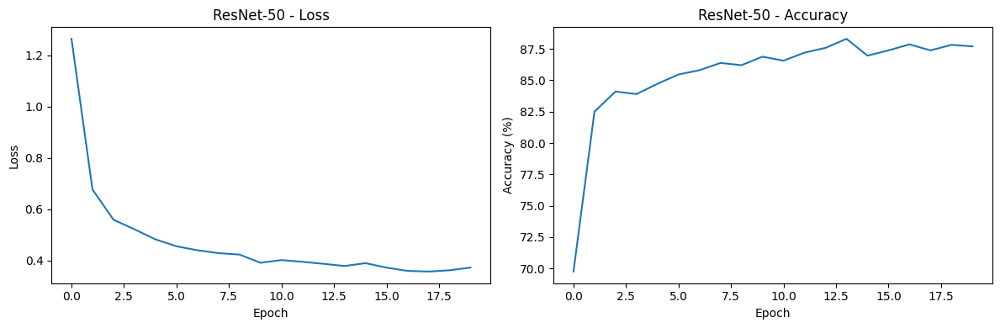

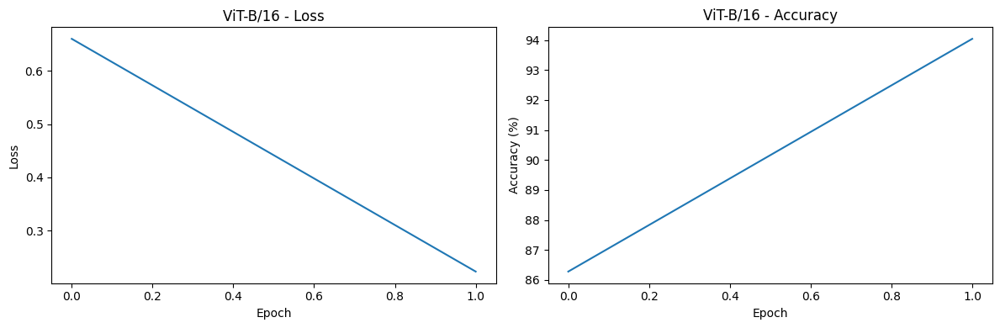

In [10]:
# Plot results
plot_curves(resnet_train_loss, resnet_train_acc, "ResNet-50")
plot_curves(vit_train_loss, vit_train_acc, "ViT-B/16")

### Save and Load Model

In [11]:
# Save model weights
def save_model(model, model_name):
    """Save model weights to a file"""
    torch.save(model.state_dict(), f'{model_name}_weights.pth')
    print(f"✅ {model_name} weights saved as '{model_name}_weights.pth'")

# Load model weights
def load_model(model, model_name):
    """Load model weights from a file"""
    model.load_state_dict(torch.load(f'{model_name}_weights.pth'))
    model.to(device)
    print(f"✅ {model_name} weights loaded from '{model_name}_weights.pth'")
    return model

# Save both models after training
save_model(resnet_model, 'resnet50')
save_model(vit_model, 'vit_b16')

# # Example of loading later for testing on different datasets
# def test_on_new_dataset(model, test_loader, model_name):
#     """Test a loaded model on a new dataset"""
#     model.eval()
#     correct = 0
#     total = 0
    
#     with torch.no_grad():
#         for inputs, labels in test_loader:
#             inputs, labels = inputs.to(device), labels.to(device)
#             outputs = model(inputs)
#             _, predicted = outputs.max(1)
#             total += labels.size(0)
#             correct += predicted.eq(labels).sum().item()
    
#     accuracy = 100. * correct / total
#     print(f"{model_name} accuracy on new dataset: {accuracy:.2f}%")
#     return accuracy

# # Later, when you want to test on a different dataset:
# Load the saved models
# loaded_resnet = create_resnet50().to(device)
# loaded_resnet = load_model(loaded_resnet, '/kaggle/input/resnet50-finetuned/pytorch/default/1/resnet50_weights.pth')

# loaded_vit = create_vit_s16().to(device)
# loaded_vit = load_model(loaded_vit, '/kaggle/input/vit16-finetuned/pytorch/default/1/vit_b16_weights.pth')

# # Test on your new dataset
# new_test_accuracy_resnet = test_on_new_dataset(loaded_resnet, new_test_loader, 'ResNet-50')
# new_test_accuracy_vit = test_on_new_dataset(loaded_vit, new_test_loader, 'ViT-B/16')

✅ resnet50 weights saved as 'resnet50_weights.pth'
✅ vit_b16 weights saved as 'vit_b16_weights.pth'


## Model Performance on Clean Test Set (Base Accuracies)

In [13]:
# Final test evaluation
print("\nFinal Test Results:")

# Test both models
resnet_test_loss, resnet_test_acc = test_model(resnet_model, base_testloader)
vit_test_loss, vit_test_acc = test_model(vit_model, base_testloader)

print(f"ResNet-50 Test Accuracy: {resnet_test_acc:.2f}%")
print(f"ViT-B/16 Test Accuracy: {vit_test_acc:.2f}%")


Final Test Results:


100%|██████████| 125/125 [00:48<00:00,  2.56it/s]

ResNet-50 Test Accuracy: 95.55%
ViT-B/16 Test Accuracy: 97.95%


In [14]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

def validate_model(model, test_loader, criterion, model_name):
    """
    Validate model performance
    """
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for inputs, labels in tqdm(test_loader, desc='Validating'):
            inputs, labels = inputs.to(device), labels.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
    
    val_loss = running_loss / len(test_loader)
    val_acc = 100. * correct / total
    
    return val_loss, val_acc

def quick_validate(model, test_loader, model_name):
    """
    Quick validation without training
    """
    criterion = nn.CrossEntropyLoss()
    val_loss, val_acc = validate_model(model, test_loader, criterion, model_name)
    print(f"{model_name} - Loss: {val_loss:.4f}, Accuracy: {val_acc:.2f}%")
    return val_loss, val_acc

quick_validate(resnet_model, base_testloader, "ResNet-50")
quick_validate(vit_model, base_testloader, "ViT-B/16")

Validating: 100%|██████████| 125/125 [00:15<00:00,  8.29it/s]


ResNet-50 - Loss: 0.1543, Accuracy: 95.55%


Validating: 100%|██████████| 125/125 [00:48<00:00,  2.55it/s]

ViT-B/16 - Loss: 0.1080, Accuracy: 97.95%


(0.10795959232747555, 97.95)

## Color Bias Testing

In [15]:
resnet_color_loss, resnet_color_acc = test_model(resnet_model, gray_testloader)
vit_color_loss, vit_color_acc = test_model(vit_model, gray_testloader)

print(f"ResNet-50 Color Test Accuracy: {resnet_color_acc:.2f}%")
print(f"ViT-B/16 Color Test Accuracy: {vit_color_acc:.2f}%")

100%|██████████| 125/125 [00:48<00:00,  2.56it/s]

ResNet-50 Color Test Accuracy: 90.10%
ViT-B/16 Color Test Accuracy: 96.24%


Original: deer
ResNet50 Pred: cat
ViT Pred: deer


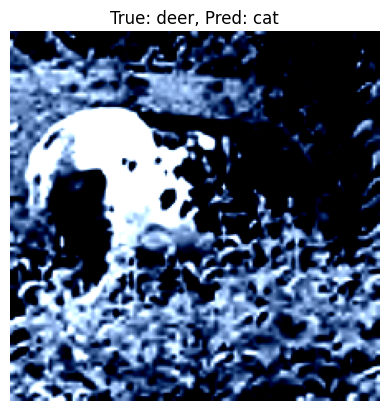

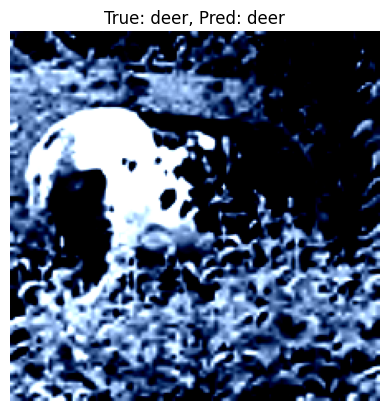

In [16]:
# Get a single grayscale image
gray_img_no = 12
gray_images, gray_labels = next(iter(gray_testloader))
gray_img = gray_images[gray_img_no].unsqueeze(0)

# Send to GPU
gray_img = gray_img.to(device)

resnet_model.eval()
with torch.no_grad():
    resnet_output = resnet_model(gray_img)

vit_model.eval()
with torch.no_grad():
    vit_output = vit_model(gray_img)

# print(output)
# print(gray_images[0].squeeze(0).shape)
# print("Prediction:", gray_pred)
gray_respred = resnet_output.argmax(dim=1).item()
gray_vitpred = vit_output.argmax(dim=1).item()

print(f"Original: {STL10_labels[gray_labels[gray_img_no].item()]}")
print(f"ResNet50 Pred: {STL10_labels[gray_respred]}")
print(f"ViT Pred: {STL10_labels[gray_vitpred]}")

img_rgb = gray_img[0].permute(1, 2, 0).cpu().numpy()
plt.imshow(img_rgb)
plt.title(f"True: {STL10_labels[gray_labels[gray_img_no].item()]}, Pred: {STL10_labels[gray_respred]}")
plt.axis("off")
plt.show()

plt.imshow(img_rgb)
plt.title(f"True: {STL10_labels[gray_labels[gray_img_no].item()]}, Pred: {STL10_labels[gray_vitpred]}")
plt.axis("off")
plt.show()

### ResNet is more biased to colors than ViT according to our results (5.45% vs 1.71%)

## Translation Invariance Test

In [17]:
resnet_trans_loss, resnet_trans_acc = test_model(resnet_model, translated_testloader)
vit_trans_loss, vit_trans_acc = test_model(vit_model, translated_testloader)

print(f"ResNet-50 Translation Invariance Test Accuracy: {resnet_trans_acc:.2f}%")
print(f"ViT-B/16 Translation Invariance Test Accuracy: {vit_trans_acc:.2f}%")

100%|██████████| 125/125 [00:48<00:00,  2.59it/s]

ResNet-50 Translation Invariance Test Accuracy: 89.92%
ViT-B/16 Translation Invariance Test Accuracy: 94.67%


### Overall interesting results: Our models are very stable to affine transformations. Yes, by design ResNet have built-in invariance to translations and ViT requires learning positional encoding. However, in our training procedure, we used RandomCrops and RandomHorizontalFlips (affine transformations), that may have made both of the models robust to translational shifts. However, we still notice that the drop in accuracy for ViT's is more compared to ResNet (89.16% vs 90.15%)

### Patch/Occlusion Testing

In [18]:
import torch
import torch.nn.functional as F
from tqdm import tqdm

class PatchMasker:
    def __init__(self, patch_size=16, mask_ratio=0.5):
        self.patch_size = patch_size
        self.mask_ratio = mask_ratio

    def __call__(self, x):
        """Apply patch masking using unfold/fold approach"""
        # Unfold into patches
        patches = F.unfold(x, kernel_size=self.patch_size, stride=self.patch_size, padding=0)
        batch_size, num_features, num_patches = patches.shape

        # Calculate number of patches to mask
        num_masked = int(num_patches * self.mask_ratio)

        # Create mask for each sample in batch
        masked_patches = patches.clone()
        for i in range(batch_size):
            # Randomly select patches to mask
            mask_indices = torch.randperm(num_patches)[:num_masked]
            masked_patches[i, :, mask_indices] = 0  # Mask with zeros

        # Fold back into image
        output = F.fold(masked_patches, x.shape[-2:], 
                       kernel_size=self.patch_size, stride=self.patch_size, padding=0)
        return output

class PatchShuffler:
    def __init__(self, patch_size=16):
        self.patch_size = patch_size

    def __call__(self, x):
        """Shuffle patches using unfold/fold approach"""
        # Unfold into patches
        patches = F.unfold(x, kernel_size=self.patch_size, stride=self.patch_size, padding=0)
        batch_size, num_features, num_patches = patches.shape

        # Shuffle patches for each sample independently
        shuffled_patches = torch.zeros_like(patches)
        for i in range(batch_size):
            shuffle_indices = torch.randperm(num_patches)
            shuffled_patches[i] = patches[i, :, shuffle_indices]

        # Fold back into image
        output = F.fold(shuffled_patches, x.shape[-2:], 
                       kernel_size=self.patch_size, stride=self.patch_size, padding=0)
        return output

def test_with_perturbations(model, test_loader, perturbations, device):
    """
    Test model with various perturbations
    Args:
        model: The model to test
        test_loader: DataLoader for test set
        perturbations: Dict of {name: perturbation_function}
        device: Device to run on
    """
    results = {}
    model.eval()

    for pert_name, pert_func in perturbations.items():
        print(f"Testing with {pert_name}...")
        correct = 0
        total = 0

        with torch.no_grad():
            for images, labels in tqdm(test_loader, desc=pert_name):
                images, labels = images.to(device), labels.to(device)

                # Apply perturbation
                perturbed_images = pert_func(images)

                # Get predictions
                outputs = model(perturbed_images)
                _, predicted = torch.max(outputs, 1)

                total += labels.size(0)
                correct += (predicted == labels).sum().item()

        accuracy = 100 * correct / total
        results[pert_name] = accuracy
        print(f"{pert_name} Accuracy: {accuracy:.2f}%")

    return results

def compare_models_robustness(models, test_loader, perturbations, device):
    """
    Compare robustness of multiple models to various perturbations
    """
    all_results = {}

    for model_name, model in models.items():
        print(f"\n=== Testing {model_name} ===")
        results = test_with_perturbations(model, test_loader, perturbations, device)
        all_results[model_name] = results

    return all_results

def visualize_perturbation_effects(models, test_loader, perturbations, device, num_examples=3):
    """
    Visualize how perturbations affect model predictions
    """
    examples = []

    # Get a batch of data
    images, labels = next(iter(test_loader))
    images, labels = images[:num_examples].to(device), labels[:num_examples].to(device)

    for model_name, model in models.items():
        model.eval()
        with torch.no_grad():
            # Get original predictions
            original_outputs = model(images)
            original_probs = F.softmax(original_outputs, dim=1)
            original_conf, original_preds = original_probs.max(1)

            model_examples = []
            for i in range(num_examples):
                example = {
                    'original_image': images[i].cpu(),
                    'original_pred': original_preds[i].item(),
                    'original_conf': original_conf[i].item(),
                    'original_label': labels[i].item(),
                    'perturbations': {}
                }

                # Apply each perturbation
                for pert_name, pert_func in perturbations.items():
                    perturbed_image = pert_func(images[i].unsqueeze(0))
                    perturbed_output = model(perturbed_image)
                    perturbed_probs = F.softmax(perturbed_output, dim=1)
                    perturbed_conf, perturbed_pred = perturbed_probs.max(1)

                    example['perturbations'][pert_name] = {
                        'image': perturbed_image[0].cpu(),
                        'prediction': perturbed_pred.item(),
                        'confidence': perturbed_conf.item(),
                        'confidence_change': original_conf[i].item() - perturbed_conf.item()
                    }

                model_examples.append(example)

            examples.append((model_name, model_examples))

    return examples

# Usage example
def run_robustness_analysis(resnet_model, vit_model, test_loader, device):
    """
    Run complete robustness analysis
    """
    # Define perturbations
    perturbations = {
        'original': lambda x: x,  # No perturbation
        'mask_25%': PatchMasker(mask_ratio=0.25),
        'mask_50%': PatchMasker(mask_ratio=0.5),
        'mask_75%': PatchMasker(mask_ratio=0.75),
        'shuffle_patches': PatchShuffler()
    }

    models = {
        'ResNet-50': resnet_model,
        'ViT-B/16': vit_model
    }

    # Test robustness
    print("=== Testing Model Robustness ===")
    results = compare_models_robustness(models, test_loader, perturbations, device)

    # Visualize effects
    print("\n=== Visualizing Perturbation Effects ===")
    examples = visualize_perturbation_effects(models, test_loader, perturbations, device)

    # Print results
    print("\n=== Results Summary ===")
    for model_name, model_results in results.items():
        print(f"\n{model_name}:")
        for pert_name, accuracy in model_results.items():
            print(f"  {pert_name}: {accuracy:.2f}%")

    return results, examples

In [19]:
# Run the analysis
results, examples = run_robustness_analysis(resnet_model, vit_model, base_testloader, device)

=== Testing Model Robustness ===

=== Testing ResNet-50 ===
Testing with original...


original: 100%|██████████| 125/125 [00:14<00:00,  8.37it/s]


original Accuracy: 95.55%
Testing with mask_25%...


mask_25%: 100%|██████████| 125/125 [00:17<00:00,  7.29it/s]


mask_25% Accuracy: 83.64%
Testing with mask_50%...


mask_50%: 100%|██████████| 125/125 [00:17<00:00,  7.22it/s]


mask_50% Accuracy: 61.80%
Testing with mask_75%...


mask_75%: 100%|██████████| 125/125 [00:17<00:00,  7.35it/s]


mask_75% Accuracy: 33.34%
Testing with shuffle_patches...


shuffle_patches: 100%|██████████| 125/125 [00:17<00:00,  7.34it/s]


shuffle_patches Accuracy: 18.00%

=== Testing ViT-B/16 ===
Testing with original...


original: 100%|██████████| 125/125 [00:48<00:00,  2.58it/s]


original Accuracy: 97.95%
Testing with mask_25%...


mask_25%: 100%|██████████| 125/125 [00:50<00:00,  2.45it/s]


mask_25% Accuracy: 96.85%
Testing with mask_50%...


mask_50%: 100%|██████████| 125/125 [00:50<00:00,  2.46it/s]


mask_50% Accuracy: 94.01%
Testing with mask_75%...


mask_75%: 100%|██████████| 125/125 [00:50<00:00,  2.45it/s]


mask_75% Accuracy: 80.84%
Testing with shuffle_patches...


shuffle_patches: 100%|██████████| 125/125 [00:50<00:00,  2.46it/s]

shuffle_patches Accuracy: 50.33%

=== Visualizing Perturbation Effects ===



=== Results Summary ===

ResNet-50:
  original: 95.55%
  mask_25%: 83.64%
  mask_50%: 61.80%
  mask_75%: 33.34%
  shuffle_patches: 18.00%

ViT-B/16:
  original: 97.95%
  mask_25%: 96.85%
  mask_50%: 94.01%
  mask_75%: 80.84%
  shuffle_patches: 50.33%


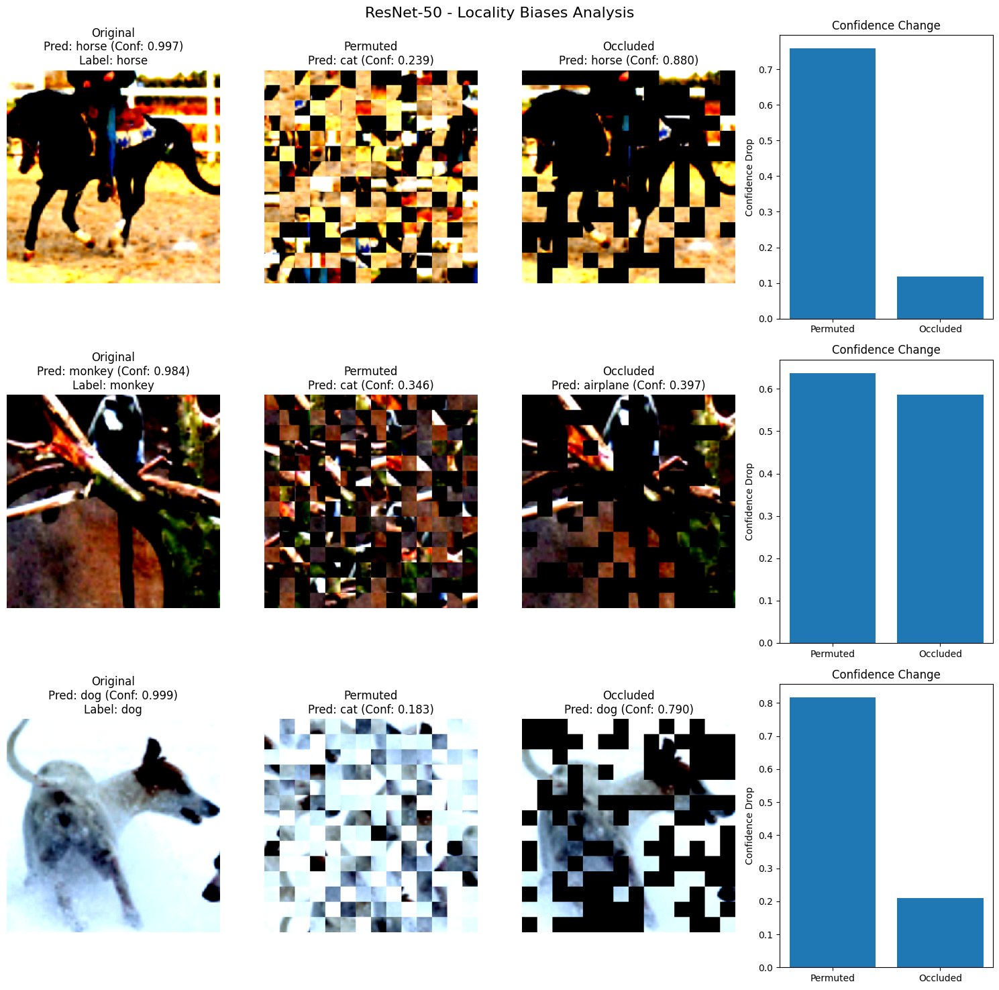

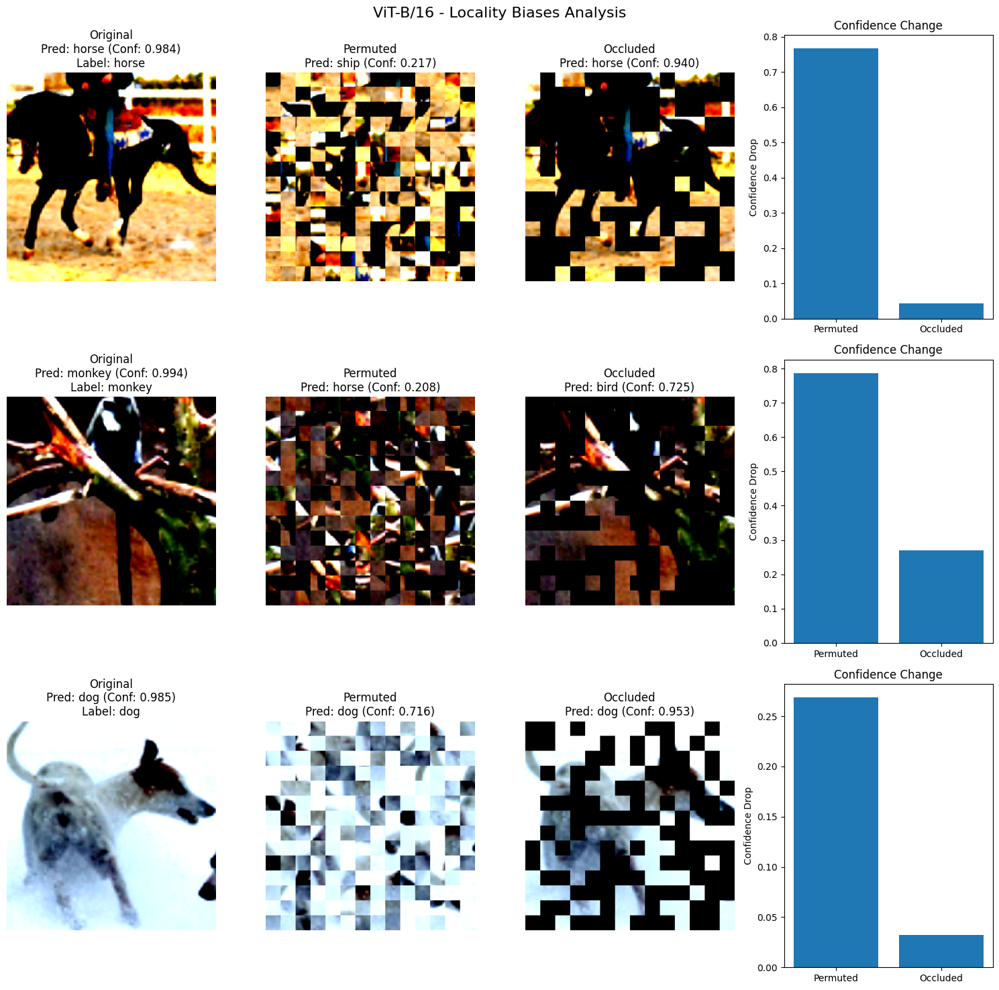

In [56]:
def plot_perturbation_examples(examples, model_name):
    """
    Plot examples of perturbations and model predictions
    """
    fig, axes = plt.subplots(len(examples), 4, figsize=(15, 5*len(examples)))
    
    if len(examples) == 1:
        axes = axes.reshape(1, -1)
    
    for i, example in enumerate(examples):
        # Original
        axes[i, 0].imshow(example['original']['image'].permute(1, 2, 0))
        axes[i, 0].set_title(f"Original\nPred: {STL10_labels[example['original']['prediction']]} "
                            f"(Conf: {example['original']['confidence']:.3f})\n"
                            f"Label: {STL10_labels[example['original']['label']]}")
        axes[i, 0].axis('off')
        
        # Permuted
        axes[i, 1].imshow(example['permuted']['image'].permute(1, 2, 0))
        axes[i, 1].set_title(f"Permuted\nPred: {STL10_labels[example['permuted']['prediction']]} "
                            f"(Conf: {example['permuted']['confidence']:.3f})")
        axes[i, 1].axis('off')
        
        # Occluded
        axes[i, 2].imshow(example['occluded']['image'].permute(1, 2, 0))
        axes[i, 2].set_title(f"Occluded\nPred: {STL10_labels[example['occluded']['prediction']]} "
                            f"(Conf: {example['occluded']['confidence']:.3f})")
        axes[i, 2].axis('off')
        
        # Confidence change
        conf_change_perm = example['original']['confidence'] - example['permuted']['confidence']
        conf_change_occ = example['original']['confidence'] - example['occluded']['confidence']
        
        axes[i, 3].bar(['Permuted', 'Occluded'], [conf_change_perm, conf_change_occ])
        axes[i, 3].set_title('Confidence Change')
        axes[i, 3].set_ylabel('Confidence Drop')
    
    plt.suptitle(f'{model_name} - Locality Biases Analysis', fontsize=16)
    plt.tight_layout()
    plt.show()


def plot_all_models_examples(examples, num_examples_per_model=5):
    """Plot examples for each model using your existing function"""
    for model_name, model_examples in examples:
        # Convert this model's examples to old format
        model_old_format = []
        for i in range(min(num_examples_per_model, len(model_examples))):
            example = model_examples[i]
            old_example = {
                'original': {
                    'image': example['original_image'],
                    'prediction': example['original_pred'],
                    'confidence': example['original_conf'],
                    'label': example['original_label']
                },
                'permuted': {
                    'image': example['perturbations']['shuffle_patches']['image'],
                    'prediction': example['perturbations']['shuffle_patches']['prediction'],
                    'confidence': example['perturbations']['shuffle_patches']['confidence']
                },
                'occluded': {
                    'image': example['perturbations']['mask_50%']['image'],
                    'prediction': example['perturbations']['mask_50%']['prediction'],
                    'confidence': example['perturbations']['mask_50%']['confidence']
                }
            }
            model_old_format.append(old_example)
        
        # Use your existing plotting function
        plot_perturbation_examples(model_old_format, model_name)

# Run it
plot_all_models_examples(examples)

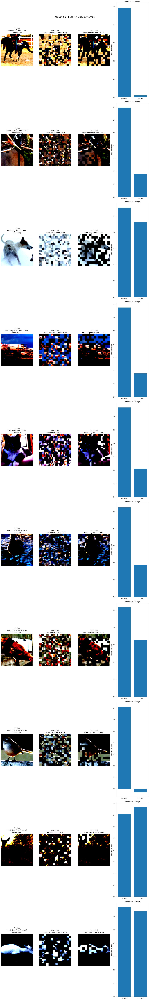

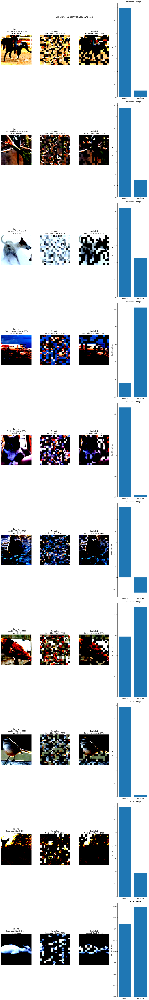

In [55]:
perturbations = {
    'original': lambda x: x,  # No perturbation
    'mask_25%': PatchMasker(mask_ratio=0.25),
    'mask_50%': PatchMasker(mask_ratio=0.5),
    'mask_75%': PatchMasker(mask_ratio=0.75),
    'shuffle_patches': PatchShuffler()
}

models = {
    'ResNet-50': resnet_model,
    'ViT-B/16': vit_model
}

vis_examples = visualize_perturbation_effects(models, base_testloader, perturbations, device, 10)
plot_all_models_examples(vis_examples, 10)

In [49]:
m_name, m_imgs = examples[0]
print(m_name)

for n, e in examples:
    print(n)
    print(len(e))

ResNet-50
ResNet-50
3
ViT-B/16
3


## Cue-Conflict (Style Transfer)


In [2]:
!git clone https://github.com/rgeirhos/texture-vs-shape
device = "cuda" if torch.cuda.is_available() else "cpu"
STL10_labels = ['airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck']

Cloning into 'texture-vs-shape'...
remote: Enumerating objects: 2375, done.
remote: Counting objects: 100% (165/165), done.
remote: Compressing objects: 100% (136/136), done.
remote: Total 2375 (delta 31), reused 154 (delta 28), pack-reused 2210 (from 1)
Receiving objects: 100% (2375/2375), 148.67 MiB | 55.32 MiB/s, done.
Resolving deltas: 100% (257/257), done.


In [7]:
import os
from PIL import Image

def clean_label(label_with_num: str) -> str:
    """Convert 'cat9' -> 'cat', 'dog1' -> 'dog', etc."""
    return ''.join([ch for ch in label_with_num if not ch.isdigit()])

def load_cue_conflict_stimuli(root_dir: str, max_samples_per_class: int = None):
    """
    Load cue conflict images but only for STL-10 classes.
    Returns a list of dicts with keys: image, shape_label, texture_label
    """
    samples = []

    for class_dir in sorted(os.listdir(root_dir)):
        full_dir = os.path.join(root_dir, class_dir)
        if not os.path.isdir(full_dir):
            continue

        # Only process if class is in STL-10
        if class_dir not in STL10_labels:
            continue

        filenames = sorted(os.listdir(full_dir))
        count = 0
        for fname in filenames:
            if not (fname.lower().endswith(".png") or fname.lower().endswith(".jpg")):
                continue

            parts = fname.split("-")
            if len(parts) < 2:
                continue

            shape_label = clean_label(parts[0])
            texture_label = clean_label(parts[1].split(".")[0])

            # Skip if either shape or texture isn’t in STL-10
            if shape_label not in STL10_labels or texture_label not in STL10_labels:
                continue

            img_path = os.path.join(full_dir, fname)
            img = Image.open(img_path).convert("RGB")

            samples.append({
                "image": img,
                "shape_label": shape_label,
                "texture_label": texture_label
            })

            count += 1
            if max_samples_per_class is not None and count >= max_samples_per_class:
                break

    print(f"Loaded {len(samples)} STL-10 cue conflict samples from {root_dir}")
    return samples

In [8]:
cue_root = "/kaggle/working/texture-vs-shape/stimuli/style-transfer-preprocessed-512"
cue_dataset = load_cue_conflict_stimuli(cue_root, max_samples_per_class=30)

print(f"Total: {len(cue_dataset)}")

Loaded 180 STL-10 cue conflict samples from /kaggle/working/texture-vs-shape/stimuli/style-transfer-preprocessed-512
Total: 180


In [9]:
print(cue_dataset[0])

{'image': <PIL.Image.Image image mode=RGB size=224x224 at 0x785E67BB3950>, 'shape_label': 'airplane', 'texture_label': 'airplane'}


In [10]:
from torch.utils.data import Dataset

class CueDataset(Dataset):
    def __init__(self, cue_list, transform=None):
        self.cue_list = cue_list    # store the list of dicts
        self.transform = transform

    def __len__(self):
        return len(self.cue_list)

    def __getitem__(self, idx):
        sample = self.cue_list[idx]   # a dict with keys "image", "shape_label", "texture_label"
        img = sample["image"]
        shape_label = sample["shape_label"]
        texture_label = sample["texture_label"]

        if self.transform:
            img = self.transform(img)

        return img, shape_label, texture_label


In [11]:
from torchvision import transforms

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

cue_dataset_wrapped = CueDataset(cue_dataset, transform=preprocess)

from torch.utils.data import DataLoader
cue_dataloader = DataLoader(cue_dataset_wrapped, batch_size=32, shuffle=False)

## Model Loading

In [12]:
def load_finetuned_resnet(weights_path, device):
    model = resnet50(weights=None)  # bare ResNet arch

    # Replace fc with 10-class head to match checkpoint
    model.fc = nn.Linear(model.fc.in_features, 10)

    # Load your fine-tuned weights
    state_dict = torch.load(weights_path, map_location=device)
    model.load_state_dict(state_dict)

    model = model.to(device)
    model.eval()

    # # Feature extractor: remove final FC
    # feature_extractor = nn.Sequential(*list(model.children())[:-1])
    return model

def load_finetuned_vit(weights_path, device):
    model = vit_b_16(weights=None)  # bare ResNet arch

    # Replace fc with 10-class head to match checkpoint
    in_feat = model.heads.head.in_features
    model.heads.head = nn.Linear(in_feat, 10)

    # Load your fine-tuned weights
    state_dict = torch.load(weights_path, map_location=device)
    model.load_state_dict(state_dict)

    model = model.to(device)
    model.eval()

    # # Feature extractor: remove final FC
    # feature_extractor = nn.Sequential(*list(model.children())[:-1])
    return model

def load_finetuned_models():
    # Example - replace with your actual model loading code
    resnet50 = load_finetuned_resnet("/kaggle/input/fine-tuned-vision-models-pacs-for-dg/pytorch/default/1/resnet50_PACS_weights.pth", device)
    vit = load_finetuned_vit("/kaggle/input/fine-tuned-vision-models-pacs-for-dg/pytorch/default/1/vit_b16_PACS_weights.pth", device)
    
    return resnet50, vit

# resnet_model, vit_model = load_finetuned_models()

In [18]:
resnet_model.eval()
with torch.no_grad():
    for imgs, shape_labels, texture_labels in cue_dataloader:
        imgs = imgs.to(device)
        outputs = resnet_model(imgs)   # shape: [batch, 1000]
        # you now have outputs + both label types
print(outputs.shape)
print(outputs.argmax(dim=1))

torch.Size([20, 10])
tensor([5, 9, 5, 5, 0, 0, 3, 9, 4, 5, 2, 4, 4, 9, 3, 2, 5, 5, 0, 2],
       device='cuda:0')


In [20]:
print(resnet_model.__class__.__name__)
print(vit_model.__class__.__name__)
print(vit_model)

ResNet
VisionTransformer
VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_aff

In [21]:
import torch
import torch.nn.functional as F

def cue_conflict(model, cue_dataloader, idx_to_class, device):
    """
    Analyze ResNet50's shape vs texture bias using cue conflict dataset.
    
    - resnet50: pretrained torchvision ResNet50 model
    - cue_dataloader: DataLoader returning (image, shape_label, texture_label)
    - idx_to_class: dict mapping ImageNet class indices -> human-readable names
    - device: torch.device("cuda" or "cpu")
    """
    print(f"\n{'='*60}")
    print(f"SHAPE VS TEXTURE BIAS ANALYSIS ({model.__class__.__name__})")
    print(f"{'='*60}")

    model.eval()
    results_detailed = []

    shape_correct, texture_correct, total = 0, 0, 0

    with torch.no_grad():
        for imgs, shape_labels, texture_labels in cue_dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs)              # [batch, 1000]
            preds = outputs.argmax(dim=1)         # [batch]

            for i in range(len(outputs)):

                # if preds[i].item() < 10:
                #     pred_class = idx_to_class[preds[i].item()]
                #     shape_label = shape_labels[i]
                #     texture_label = texture_labels[i]
                # else:
                #     pred_class = "Misc"
                #     shape_label = shape_labels[i]
                #     texture_label = texture_labels[i]

                # print("Max prediction index:", preds.max().item())
                # print("Length of idx_to_class:", len(idx_to_class))

                pred_class = idx_to_class[preds[i].item()]
                shape_label = shape_labels[i]
                texture_label = texture_labels[i]

                if pred_class == shape_label:
                    chosen = "shape_label"
                    shape_correct += 1
                elif pred_class == texture_label:
                    chosen = "texture_label"
                    texture_correct += 1
                else:
                    chosen = "other"

                results_detailed.append({
                    "shape_label": shape_label,
                    "texture_label": texture_label,
                    "pred_class": pred_class,
                    "chosen": chosen
                })

                print(f"Image: Shape={shape_label}, Texture={texture_label} → {model.__class__.__name__} predicted {pred_class} ({chosen})")

                total += 1

    # Summary
    print(f"\n{'-'*60}")
    print(f"Total images: {total}")
    print(f"Shape bias: {shape_correct/(shape_correct+texture_correct)*100:.1f}% ({shape_correct}/{shape_correct+texture_correct})")
    print(f"Texture bias: {texture_correct/(shape_correct+texture_correct)*100:.1f}% ({texture_correct}/{shape_correct+texture_correct})")
    # print(f"Other: {(total-shape_correct-texture_correct)/total*100:.1f}% "
    #       f"({total-shape_correct-texture_correct}/{total})")
    print(f"{'-'*60}")

    return results_detailed


In [22]:
resnet_shape_texture_results = cue_conflict(resnet_model, cue_dataloader, STL10_labels, device)


SHAPE VS TEXTURE BIAS ANALYSIS (ResNet)
Image: Shape=airplane, Texture=airplane → ResNet predicted airplane (shape_label)
Image: Shape=airplane, Texture=car → ResNet predicted cat (other)
Image: Shape=airplane, Texture=cat → ResNet predicted deer (other)
Image: Shape=airplane, Texture=dog → ResNet predicted dog (texture_label)
Image: Shape=airplane, Texture=truck → ResNet predicted car (other)
Image: Shape=airplane, Texture=bird → ResNet predicted airplane (shape_label)
Image: Shape=airplane, Texture=cat → ResNet predicted dog (other)
Image: Shape=airplane, Texture=dog → ResNet predicted dog (texture_label)
Image: Shape=airplane, Texture=airplane → ResNet predicted airplane (shape_label)
Image: Shape=airplane, Texture=car → ResNet predicted cat (other)
Image: Shape=airplane, Texture=cat → ResNet predicted dog (other)
Image: Shape=airplane, Texture=dog → ResNet predicted dog (texture_label)
Image: Shape=airplane, Texture=airplane → ResNet predicted airplane (shape_label)
Image: Shape=a

In [23]:
vit_shape_texture_results = cue_conflict(vit_model, cue_dataloader, STL10_labels, device)


SHAPE VS TEXTURE BIAS ANALYSIS (VisionTransformer)
Image: Shape=airplane, Texture=airplane → VisionTransformer predicted airplane (shape_label)
Image: Shape=airplane, Texture=car → VisionTransformer predicted car (texture_label)
Image: Shape=airplane, Texture=cat → VisionTransformer predicted cat (texture_label)
Image: Shape=airplane, Texture=dog → VisionTransformer predicted horse (other)
Image: Shape=airplane, Texture=truck → VisionTransformer predicted car (other)
Image: Shape=airplane, Texture=bird → VisionTransformer predicted airplane (shape_label)
Image: Shape=airplane, Texture=cat → VisionTransformer predicted cat (texture_label)
Image: Shape=airplane, Texture=dog → VisionTransformer predicted horse (other)
Image: Shape=airplane, Texture=airplane → VisionTransformer predicted airplane (shape_label)
Image: Shape=airplane, Texture=car → VisionTransformer predicted airplane (shape_label)
Image: Shape=airplane, Texture=cat → VisionTransformer predicted cat (texture_label)
Image: S

In [77]:
import matplotlib.pyplot as plt
import torch

def visualize_cue_conflict(model, cue_dataset, idx_to_class, device, n_samples=6):
    """
    Visualize cue conflict predictions.
    
    Shows the image, shape label, texture label, and model prediction.
    - model: vision model (e.g. resnet50)
    - cue_dataset: dataset (not dataloader) returning (image_tensor, shape_label, texture_label)
    - idx_to_class: mapping {class_idx -> class_name}
    - n_samples: number of examples to display
    """
    model.eval()

    fig, axes = plt.subplots(1, n_samples, figsize=(4*n_samples, 4))
    if n_samples == 1:
        axes = [axes]

    indices = torch.randint(0, len(cue_dataset), (n_samples,))

    with torch.no_grad():
        for ax, idx in zip(axes, indices):
            img_tensor, shape_label, texture_label = cue_dataset[idx]

            # model expects batch
            img_batch = img_tensor.unsqueeze(0).to(device)
            outputs = model(img_batch)
            pred_idx = outputs.argmax(dim=1).item()
            pred_class = idx_to_class[pred_idx] if pred_idx in idx_to_class else "Misc"

            # convert tensor back to image for display
            img_np = img_tensor.permute(1, 2, 0).cpu().numpy()
            img_np = img_np * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]  # de-normalize
            img_np = img_np.clip(0, 1)

            ax.imshow(img_np)
            ax.axis("off")
            ax.set_title(
                f"Shape: {shape_label}\nTexture: {texture_label}\nPred: {pred_class}",
                fontsize=10
            )

    plt.tight_layout()
    plt.show()


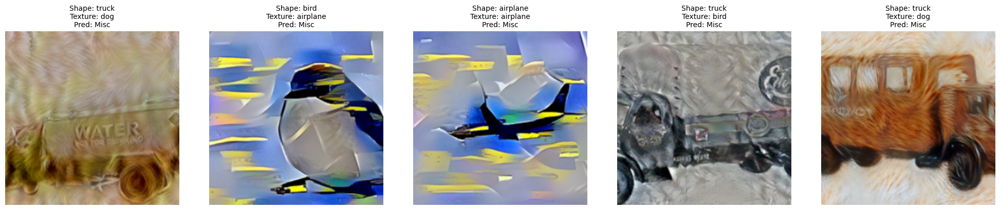

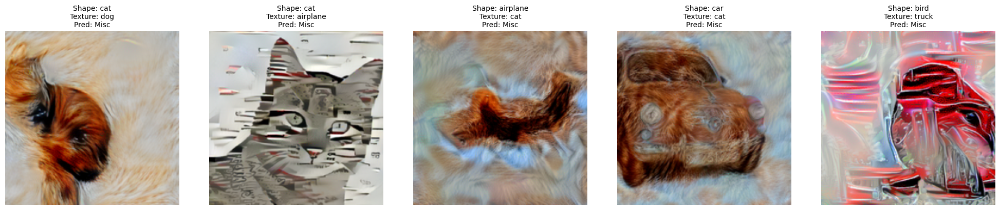

In [79]:
visualize_cue_conflict(resnet_model, cue_dataset_wrapped, STL10_labels, device, n_samples=5)
visualize_cue_conflict(vit_model, cue_dataset_wrapped, STL10_labels, device, n_samples=5)

## Feature Visualization

In [80]:
import torch
import torch.nn as nn
from torchvision import transforms, models
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import umap
from sklearn.preprocessing import StandardScaler
import seaborn as sns

2025-09-22 12:58:31.384084: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758545911.576755      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758545911.636309      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [81]:
class FeatureExtractor(nn.Module):
    def __init__(self, model, layer_name):
        super(FeatureExtractor, self).__init__()
        self.model = model
        self.layer_name = layer_name
        self.features = None
        self.hook = self._register_hook()
    
    def _register_hook(self):
        def hook_fn(module, input, output):
            self.features = output
        
        # Register hook based on model type
        if isinstance(self.model, models.ResNet):
            layer = getattr(self.model, self.layer_name)
        else:  # ViT
            layer = getattr(self.model, self.layer_name)
        
        return layer.register_forward_hook(hook_fn)
    
    def forward(self, x):
        _ = self.model(x)
        return self.features

def load_fine_tuned_model(model_type, model_path):
    """Load your fine-tuned models"""
    if model_type == 'resnet50':
        model = models.resnet50(pretrained=False)
        model.fc = nn.Linear(model.fc.in_features, 10)  # STL10 has 10 classes
    elif model_type == 'vit_b_16':
        model = models.vit_b_16(pretrained=False)
        model.heads.head = nn.Linear(model.heads.head.in_features, 10)
    
    # Load your fine-tuned weights
    model.load_state_dict(torch.load(model_path, map_location=device))
    model = model.to(device)
    model.eval()
    
    return model

In [82]:
def extract_features(model, dataloader, model_type):
    """Extract features from the model"""
    features = []
    labels = []
    
    with torch.no_grad():
        for batch_idx, (data, target) in enumerate(dataloader):
            data = data.to(device)
            
            if model_type == 'resnet50':
                # For ResNet50, extract features before the final layer
                feature_extractor = FeatureExtractor(model, 'avgpool')
                batch_features = feature_extractor(data)
                batch_features = batch_features.view(batch_features.size(0), -1)
            else:  # ViT-B/16
                # For ViT, extract features from the last hidden state
                batch_features = model._get_features(data)
            
            features.append(batch_features.cpu().numpy())
            labels.append(target.numpy())
            
            if batch_idx % 10 == 0:
                print(f'Processed batch {batch_idx}/{len(dataloader)}')
    
    features = np.vstack(features)
    labels = np.concatenate(labels)
    
    return features, labels

In [83]:
def plot_embeddings(embeddings, labels, title, class_names):
    """Plot 2D embeddings"""
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(embeddings[:, 0], embeddings[:, 1], 
                         c=labels, cmap='tab10', alpha=0.7, s=10)
    plt.colorbar(scatter, ticks=range(10))
    plt.title(title, fontsize=16)
    plt.xlabel('Component 1', fontsize=12)
    plt.ylabel('Component 2', fontsize=12)
    
    # Create legend
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', 
                                markerfacecolor=plt.cm.tab10(i/10), 
                                markersize=8, label=class_names[i]) 
                      for i in range(10)]
    plt.legend(handles=legend_elements, loc='best')
    plt.tight_layout()
    plt.show()

def compare_embeddings(embeddings_list, labels, titles, class_names):
    """Compare multiple embeddings side by side"""
    fig, axes = plt.subplots(1, len(embeddings_list), figsize=(6*len(embeddings_list), 5))
    
    if len(embeddings_list) == 1:
        axes = [axes]
    
    for i, (embeddings, title) in enumerate(zip(embeddings_list, titles)):
        scatter = axes[i].scatter(embeddings[:, 0], embeddings[:, 1], 
                                c=labels, cmap='tab10', alpha=0.7, s=10)
        axes[i].set_title(title, fontsize=14)
        axes[i].set_xlabel('Component 1', fontsize=10)
        axes[i].set_ylabel('Component 2', fontsize=10)
    
    plt.tight_layout()
    plt.show()

In [86]:
def extract_vit_features(model, dataloader):
    """Alternative ViT feature extraction"""
    features = []
    labels = []
    
    with torch.no_grad():
        for data, target in dataloader:
            data = data.to(device)
            
            # Extract features from ViT
            x = model._process_input(data)
            n = x.shape[0]
            
            # Expand the class token to the full batch
            batch_class_token = model.class_token.expand(n, -1, -1)
            x = torch.cat([batch_class_token, x], dim=1)
            
            x = model.encoder(x)
            
            # Use the class token features
            batch_features = x[:, 0].cpu().numpy()
            
            features.append(batch_features)
            labels.append(target.numpy())
    
    features = np.vstack(features)
    labels = np.concatenate(labels)
    
    return features, labels

In [87]:
# # Load your fine-tuned models (replace with your actual model paths)
# resnet_model = load_fine_tuned_model('resnet50', '/kaggle/working/resnet50_weights.pth')
# vit_model = load_fine_tuned_model('vit_b_16', '/kaggle/working/vit_b16_weights.pth')

# Extract features
print("Extracting features from ResNet50...")
resnet_features, labels = extract_features(resnet_model, base_testloader, 'resnet50')

print("Extracting features from ViT-B/16...")
# vit_features, labels = extract_features(vit_model, base_testloader, 'vit_b_16')
vit_features, labels = extract_vit_features(vit_model, base_testloader)

# Standardize features
scaler = StandardScaler()
resnet_features_scaled = scaler.fit_transform(resnet_features)
vit_features_scaled = scaler.fit_transform(vit_features)

# Apply t-SNE
print("Applying t-SNE...")
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)

resnet_tsne = tsne.fit_transform(resnet_features_scaled)
vit_tsne = tsne.fit_transform(vit_features_scaled)

# Apply UMAP
print("Applying UMAP...")
umap_reducer = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)

resnet_umap = umap_reducer.fit_transform(resnet_features_scaled)
vit_umap = umap_reducer.fit_transform(vit_features_scaled)

Extracting features from ResNet50...
Processed batch 0/125
Processed batch 10/125
Processed batch 20/125
Processed batch 30/125
Processed batch 40/125
Processed batch 50/125
Processed batch 60/125
Processed batch 70/125
Processed batch 80/125
Processed batch 90/125
Processed batch 100/125
Processed batch 110/125
Processed batch 120/125
Extracting features from ViT-B/16...
Applying t-SNE...
Applying UMAP...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


NameError: name 'class_names' is not defined

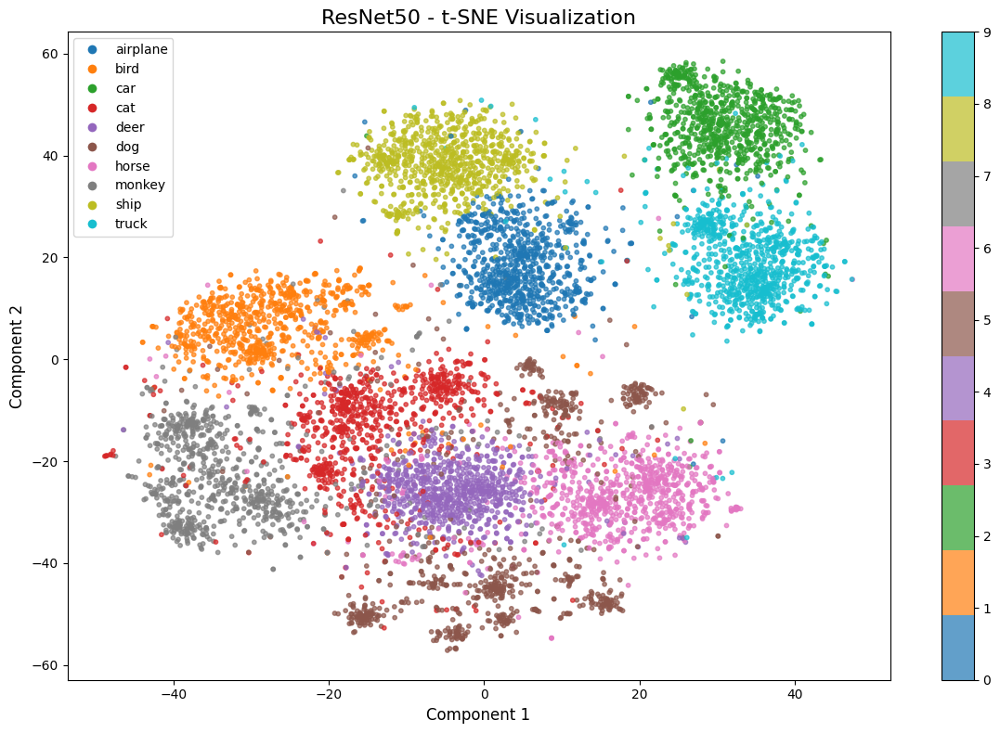

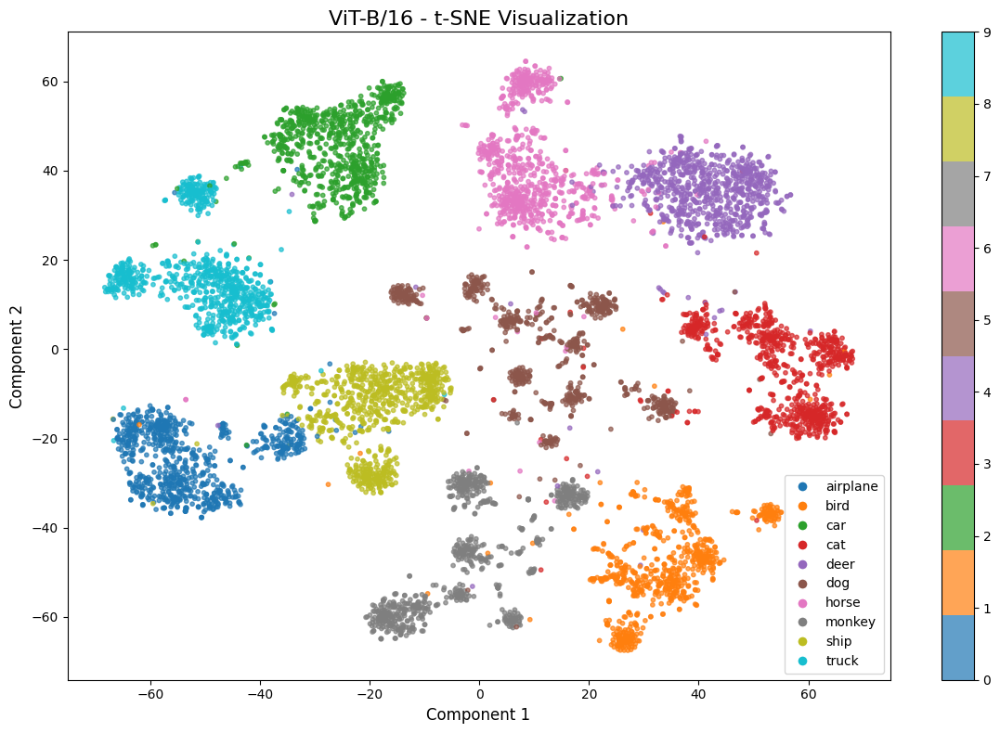

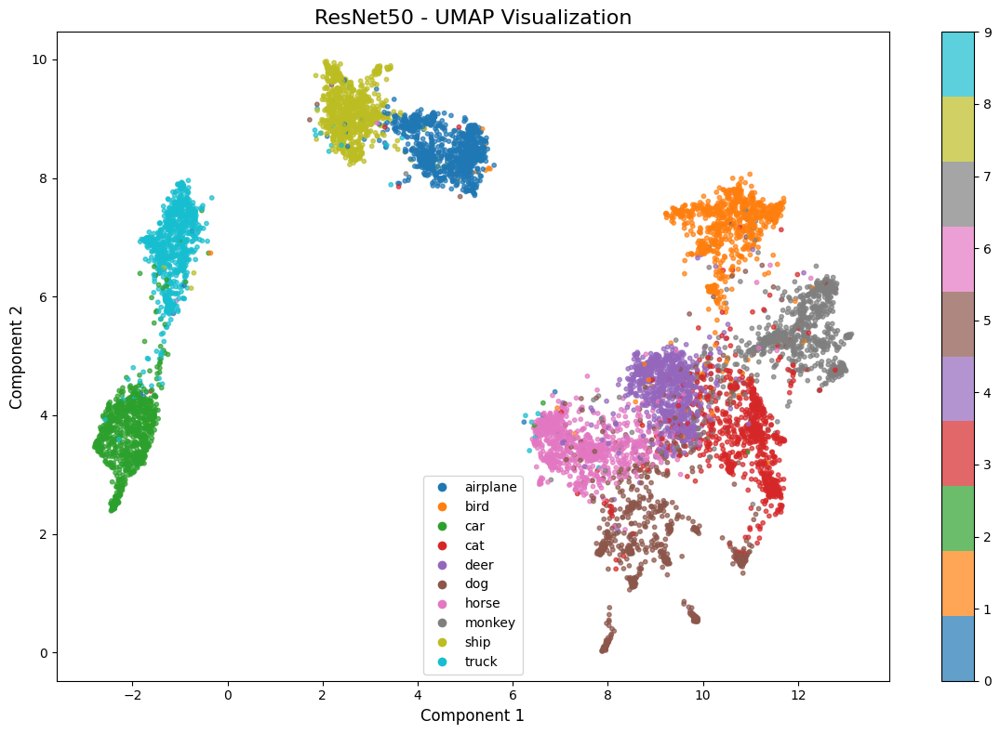

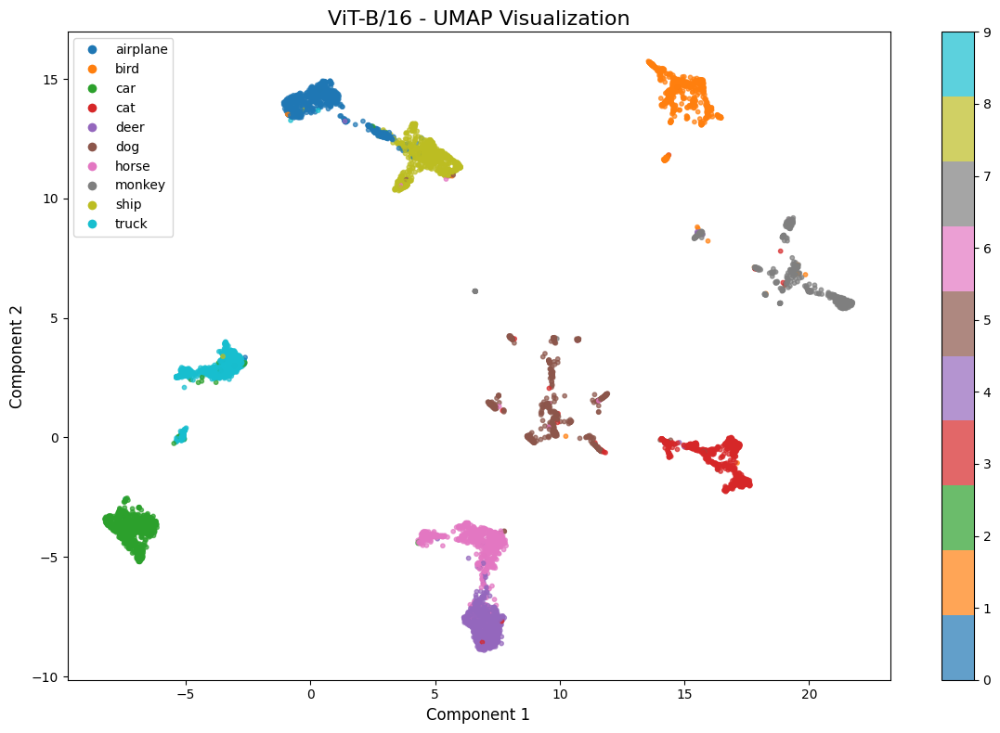

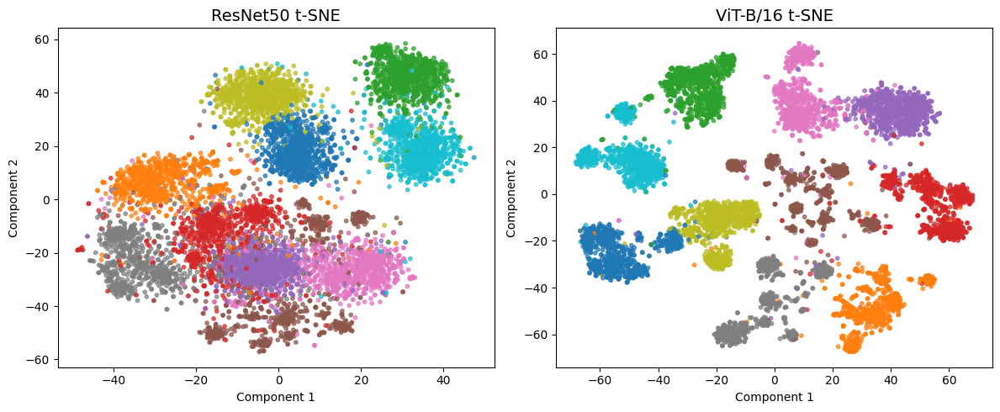

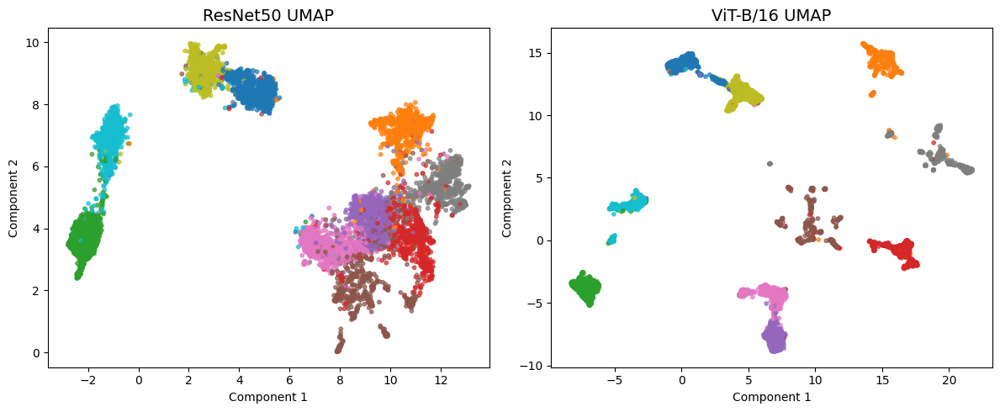

In [88]:
# Plot results
plot_embeddings(resnet_tsne, labels, 'ResNet50 - t-SNE Visualization', STL10_labels)
plot_embeddings(vit_tsne, labels, 'ViT-B/16 - t-SNE Visualization', STL10_labels)
plot_embeddings(resnet_umap, labels, 'ResNet50 - UMAP Visualization', STL10_labels)
plot_embeddings(vit_umap, labels, 'ViT-B/16 - UMAP Visualization', STL10_labels)

# Compare models
compare_embeddings([resnet_tsne, vit_tsne], labels, 
                  ['ResNet50 t-SNE', 'ViT-B/16 t-SNE'], STL10_labels)
compare_embeddings([resnet_umap, vit_umap], labels, 
                  ['ResNet50 UMAP', 'ViT-B/16 UMAP'], STL10_labels)

# return {
#     'resnet_features': resnet_features,
#     'vit_features': vit_features,
#     'resnet_tsne': resnet_tsne,
#     'vit_tsne': vit_tsne,
#     'resnet_umap': resnet_umap,
#     'vit_umap': vit_umap,
#     'labels': labels
# }

## PACS for Domain Generalization

In [3]:
from datasets import load_dataset

pacs_dataset = load_dataset("flwrlabs/pacs")
print(pacs_dataset)

README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/191M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/9991 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'domain', 'label'],
        num_rows: 9991
    })
})


In [5]:
train_domains = ["photo", "cartoon", "art_painting"]
test_domain = "sketch"

pacs_train_data = pacs_dataset["train"].filter(lambda x: x["domain"] in train_domains)
pacs_test_data = pacs_dataset["train"].filter(lambda x: x["domain"] == test_domain)

from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

pacs_classes = ['dog', 'elephant', 'giraffe', 'guitar', 'horse', 'house', 'person']

pacs_resnet50 = create_resnet50(len(pacs_classes)).to(device)
pacs_vit16 = create_vit_s16(len(pacs_classes)).to(device)

# Freeze Backbone Network (ResNet)
for param in pacs_resnet50.parameters():
    param.requires_grad = False
#  Unfreeze Task Head
for param in pacs_resnet50.fc.parameters():
    param.requires_grad = True

# Freeze Backbone Network (ViT)
for param in pacs_vit16.parameters():
        param.requires_grad = False
#  Unfreeze Task Head
for param in pacs_vit16.heads.head.parameters():
    param.requires_grad = True

Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

Filter:   0%|          | 0/9991 [00:00<?, ? examples/s]

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 220MB/s]
Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth
100%|██████████| 330M/330M [00:01<00:00, 230MB/s] 


In [6]:
print(pacs_train_data)
print(pacs_train_data.features)

Dataset({
    features: ['image', 'domain', 'label'],
    num_rows: 6062
})
{'image': Image(mode=None, decode=True, id=None), 'domain': Value(dtype='string', id=None), 'label': ClassLabel(names=['dog', 'elephant', 'giraffe', 'guitar', 'horse', 'house', 'person'], id=None)}


In [6]:
from torch.utils.data import Dataset

# train_transform = transforms.Compose([
#     transforms.Resize((224, 224)),
#     transforms.RandomHorizontalFlip(p=0.5),
#     transforms.RandomRotation(degrees=10),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
# ])

# test_transform = transforms.Compose([
#     transforms.Resize((224, 224)),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
# ])

class PACSDataset(Dataset):
    def __init__(self, hf_dataset, transform=None):
        self.dataset = hf_dataset
        self.transform = transform
    
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = item['image'].convert('RGB')
        label = item['label']
        
        if self.transform:
            image = self.transform(image)
        
        return {
            'pixel_values': image,
            'labels': torch.tensor(label, dtype=torch.long)
        }

# # Using the custom Dataset class
# pacs_trainset = PACSDataset(pacs_train_data, transform=train_transform)
# pacs_testset = PACSDataset(pacs_test_data, transform=test_transform)

# pacs_trainloader = DataLoader(
#     pacs_trainset, 
#     batch_size=32, 
#     shuffle=True,
#     num_workers=4
# )

# pacs_testloader = DataLoader(
#     pacs_testset, 
#     batch_size=32, 
#     shuffle=False,
#     num_workers=4
# )

In [122]:
for batch in train_dataloader:
    print(f"Batch pixel values shape: {batch['pixel_values'].shape}")
    print(f"Batch labels shape: {batch['labels'].shape}")
    print(f"Labels: {batch['labels']}")
    break

Batch pixel values shape: torch.Size([32, 3, 224, 224])
Batch labels shape: torch.Size([32])
Labels: tensor([1, 1, 3, 1, 5, 4, 4, 2, 6, 4, 0, 1, 6, 2, 5, 0, 5, 1, 4, 1, 4, 1, 6, 6,
        1, 6, 0, 0, 5, 5, 1, 4])


In [14]:
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(pacs_resnet50.parameters(), lr=0.001)

def train_model_PACS(model, dataloader, criterion, optimizer, epochs=10):
    model.train()
    train_losses, train_accs = [], []
    
    for epoch in range(epochs):
        running_loss = 0.0
        correct_predictions = 0
        total_samples = 0
        
        for batch in dataloader:
            inputs = batch['pixel_values'].to(device)
            labels = batch['labels'].to(device)
            
            optimizer.zero_grad()
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_samples += labels.size(0)
            correct_predictions += (predicted == labels).sum().item()
        
        epoch_loss = running_loss / len(dataloader)
        epoch_acc = 100 * correct_predictions / total_samples
        train_losses.append(epoch_loss)
        train_accs.append(epoch_acc)
        
        print(f'Epoch [{epoch+1}/{epochs}], Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%')

    return train_losses, train_accs

def test_model_PACS(model, dataloader):
    model.eval()
    running_loss = 0.0
    correct_predictions = 0
    total_samples = 0
    all_predictions = []
    all_labels = []
    
    with torch.no_grad():
        for batch in dataloader:
            inputs = batch['pixel_values'].to(device)
            labels = batch['labels'].to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_samples += labels.size(0)
            correct_predictions += (predicted == labels).sum().item()
            
            # Store for detailed analysis
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    test_loss = running_loss / len(dataloader)
    test_accuracy = 100 * correct_predictions / total_samples
    
    return test_loss, test_accuracy, all_predictions, all_labels

In [142]:
# Train ResNet-50 on PACS
print("Training ResNet-50 on PACS")
resnet_train_loss, resnet_train_acc = train_model_PACS(
    pacs_resnet50, pacs_trainloader, criterion, optimizer, epochs=10
)

# Train ViT on PACS
print("\nTraining ViT-B/16 on PACS")
vit_train_loss, vit_train_acc = train_model_PACS(
    pacs_vit16, pacs_trainloader, criterion, optimizer, epochs=10
)

Training ResNet-50 on PACS


Epoch 1/10: 100%|██████████| 190/190 [00:13<00:00, 14.30it/s]


Epoch [1/10], Loss: 0.7643, Accuracy: 80.07%


Epoch 2/10: 100%|██████████| 190/190 [00:13<00:00, 14.30it/s]


Epoch [2/10], Loss: 0.3860, Accuracy: 89.26%


Epoch 3/10: 100%|██████████| 190/190 [00:13<00:00, 14.27it/s]


Epoch [3/10], Loss: 0.3037, Accuracy: 91.55%


Epoch 4/10: 100%|██████████| 190/190 [00:13<00:00, 14.26it/s]


Epoch [4/10], Loss: 0.2671, Accuracy: 91.98%


Epoch 5/10: 100%|██████████| 190/190 [00:13<00:00, 14.29it/s]


Epoch [5/10], Loss: 0.2296, Accuracy: 93.32%


Epoch 6/10: 100%|██████████| 190/190 [00:13<00:00, 14.27it/s]


Epoch [6/10], Loss: 0.2190, Accuracy: 93.42%


Epoch 7/10: 100%|██████████| 190/190 [00:13<00:00, 14.29it/s]


Epoch [7/10], Loss: 0.1941, Accuracy: 94.31%


Epoch 8/10: 100%|██████████| 190/190 [00:13<00:00, 14.29it/s]


Epoch [8/10], Loss: 0.1884, Accuracy: 94.36%


Epoch 9/10: 100%|██████████| 190/190 [00:13<00:00, 14.24it/s]


Epoch [9/10], Loss: 0.1703, Accuracy: 94.80%


Epoch 10/10: 100%|██████████| 190/190 [00:13<00:00, 14.27it/s]


Epoch [10/10], Loss: 0.1570, Accuracy: 95.18%

Training ViT-B/16 on PACS


Epoch 1/10: 100%|██████████| 190/190 [00:44<00:00,  4.25it/s]


Epoch [1/10], Loss: 2.0359, Accuracy: 16.22%


Epoch 2/10: 100%|██████████| 190/190 [00:44<00:00,  4.25it/s]


Epoch [2/10], Loss: 2.0355, Accuracy: 16.58%


Epoch 3/10: 100%|██████████| 190/190 [00:44<00:00,  4.26it/s]


Epoch [3/10], Loss: 2.0344, Accuracy: 16.15%


Epoch 4/10: 100%|██████████| 190/190 [00:44<00:00,  4.26it/s]


Epoch [4/10], Loss: 2.0371, Accuracy: 15.80%


Epoch 5/10: 100%|██████████| 190/190 [00:44<00:00,  4.25it/s]


Epoch [5/10], Loss: 2.0352, Accuracy: 16.10%


Epoch 6/10: 100%|██████████| 190/190 [00:44<00:00,  4.26it/s]


Epoch [6/10], Loss: 2.0358, Accuracy: 16.27%


Epoch 7/10: 100%|██████████| 190/190 [00:44<00:00,  4.25it/s]


Epoch [7/10], Loss: 2.0362, Accuracy: 16.38%


Epoch 8/10: 100%|██████████| 190/190 [00:44<00:00,  4.26it/s]


Epoch [8/10], Loss: 2.0343, Accuracy: 16.58%


Epoch 9/10: 100%|██████████| 190/190 [00:44<00:00,  4.26it/s]


Epoch [9/10], Loss: 2.0329, Accuracy: 16.30%


Epoch 10/10: 100%|██████████| 190/190 [00:44<00:00,  4.26it/s]

Epoch [10/10], Loss: 2.0344, Accuracy: 16.68%


In [8]:
from torchvision import transforms

# Get the correct transforms from the weights
resnet_weights = ResNet50_Weights.IMAGENET1K_V2
vit_weights = ViT_B_16_Weights.IMAGENET1K_V1

# Use the transforms that match the pre-training
resnet_transform = resnet_weights.transforms()
vit_transform = vit_weights.transforms()

print("ResNet transforms:", resnet_transform)
print("ViT transforms:", vit_transform)

ResNet transforms: ImageClassification(
    crop_size=[224]
    resize_size=[232]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)
ViT transforms: ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)


In [9]:
# Create separate datasets with model-specific transforms
train_dataset_resnet = PACSDataset(pacs_train_data, transform=resnet_transform)
train_dataset_vit = PACSDataset(pacs_train_data, transform=vit_transform)

test_dataset_resnet = PACSDataset(pacs_test_data, transform=resnet_transform) 
test_dataset_vit = PACSDataset(pacs_test_data, transform=vit_transform)

# Create DataLoaders
train_loader_resnet = DataLoader(train_dataset_resnet, batch_size=32, shuffle=True, num_workers=4)
train_loader_vit = DataLoader(train_dataset_vit, batch_size=32, shuffle=True, num_workers=4)

test_loader_resnet = DataLoader(test_dataset_resnet, batch_size=32, shuffle=False, num_workers=4)
test_loader_vit = DataLoader(test_dataset_vit, batch_size=32, shuffle=False, num_workers=4)

In [10]:
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingLR

# Different optimizers for each model
resnet_optimizer = optim.Adam(pacs_resnet50.fc.parameters(), lr=1e-3, weight_decay=1e-4)
vit_optimizer = optim.AdamW(pacs_vit16.heads.head.parameters(), lr=1e-4, weight_decay=0.01)  # Lower LR for ViT!

# Different schedulers
resnet_scheduler = optim.lr_scheduler.StepLR(resnet_optimizer, step_size=7, gamma=0.1)
vit_scheduler = CosineAnnealingLR(vit_optimizer, T_max=10)  # Cosine annealing works better for ViT

criterion = nn.CrossEntropyLoss()


In [15]:
import tqdm

def train_ViT_PACS(model, dataloader, optimizer, scheduler, criterion, epochs=10):
    model.train()
    train_losses, train_accs = [], []
    
    for epoch in range(epochs):
        running_loss = 0.0
        correct_predictions = 0
        total_samples = 0
        
        for batch in dataloader:
            inputs = batch['pixel_values'].to(device)
            labels = batch['labels'].to(device)
            
            optimizer.zero_grad()
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total_samples += labels.size(0)
            correct_predictions += (predicted == labels).sum().item()

        scheduler.step()
        epoch_loss = running_loss / len(dataloader)
        epoch_acc = 100 * correct_predictions / total_samples
        train_losses.append(epoch_loss)
        train_accs.append(epoch_acc)
        
        print(f'Epoch [{epoch+1}/{epochs}], Loss: {epoch_loss:.4f}, Accuracy: {epoch_acc:.2f}%')

    return train_losses, train_accs

# Train both models
print("Training ResNet50...")
resnet_pacstrain_losses, resnet_pacstrain_acc = train_model_PACS(pacs_resnet50, train_loader_resnet, criterion, resnet_optimizer)

print("\nTraining ViT-B/16...")
vit_pacstrain_losses, vit_pacstrain_acc = train_ViT_PACS(pacs_vit16, train_loader_vit, vit_optimizer, vit_scheduler, criterion)


Training ResNet50...
Epoch [1/10], Loss: 0.7519, Accuracy: 80.34%
Epoch [2/10], Loss: 0.3459, Accuracy: 90.75%
Epoch [3/10], Loss: 0.2665, Accuracy: 93.01%
Epoch [4/10], Loss: 0.2254, Accuracy: 94.08%
Epoch [5/10], Loss: 0.2004, Accuracy: 94.41%
Epoch [6/10], Loss: 0.1710, Accuracy: 95.78%
Epoch [7/10], Loss: 0.1599, Accuracy: 95.65%
Epoch [8/10], Loss: 0.1444, Accuracy: 96.11%
Epoch [9/10], Loss: 0.1351, Accuracy: 96.37%
Epoch [10/10], Loss: 0.1221, Accuracy: 96.95%

Training ViT-B/16...
Epoch [1/10], Loss: 1.4715, Accuracy: 53.89%
Epoch [2/10], Loss: 0.9026, Accuracy: 80.70%
Epoch [3/10], Loss: 0.6746, Accuracy: 86.36%
Epoch [4/10], Loss: 0.5588, Accuracy: 88.78%
Epoch [5/10], Loss: 0.4911, Accuracy: 89.99%
Epoch [6/10], Loss: 0.4502, Accuracy: 90.66%
Epoch [7/10], Loss: 0.4233, Accuracy: 91.03%
Epoch [8/10], Loss: 0.4079, Accuracy: 91.36%
Epoch [9/10], Loss: 0.4006, Accuracy: 91.41%
Epoch [10/10], Loss: 0.3971, Accuracy: 91.42%


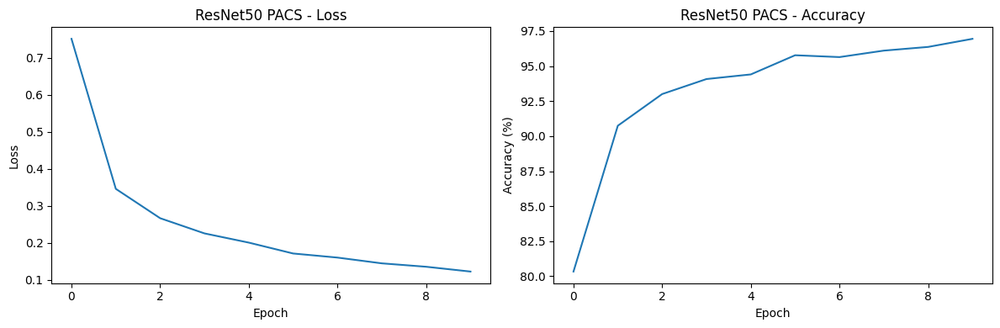

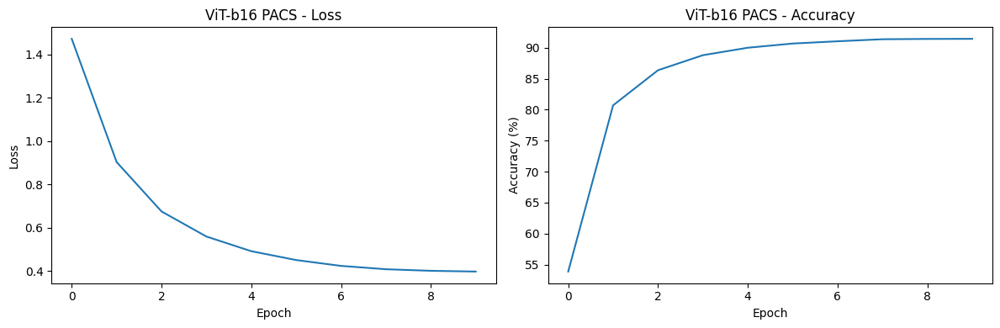

In [18]:
plot_curves(resnet_pacstrain_losses, resnet_pacstrain_acc, "ResNet50 PACS")
plot_curves(vit_pacstrain_losses, vit_pacstrain_acc, "ViT-b16 PACS")

In [19]:
# Testing/Evaluating both the models on PAC Test Domain
resnet_test_loss, resnet_test_acc, resnet_preds, resnet_labels = test_model_PACS(pacs_resnet50, test_loader_resnet)
vit_test_loss, vit_test_acc, vit_preds, vit_labels = test_model_PACS(pacs_vit16, test_loader_vit)

In [20]:
print(f"ResNet 50 Domain Shift Accuracy: {resnet_test_acc}")
print(f"ViT b16 Domain Shift Accuracy: {vit_test_acc}")

ResNet 50 Domain Shift Accuracy: 54.568592517179944
ViT b16 Domain Shift Accuracy: 36.777806057521


In [41]:
print(f"ResNet 50 Domain Shift Correct Predictions: {torch.sum(torch.tensor(resnet_labels) == torch.tensor(resnet_preds))}")
print(f"ViT b16 Domain Shift Accuracy: {torch.sum(torch.tensor(vit_labels) == torch.tensor(vit_preds))}")
print(f"Total Test Domain Size: {len(test_dataset_resnet)}")

ResNet 50 Domain Shift Correct Predictions: 2144
ViT b16 Domain Shift Accuracy: 1445
Total Test Domain Size: 3929


In [152]:
save_model(resnet_model, 'resnet50_PACS')
save_model(vit_model, 'vit_b16_PACS')

✅ resnet50_PACS weights saved as 'resnet50_PACS_weights.pth'
✅ vit_b16_PACS weights saved as 'vit_b16_PACS_weights.pth'
